<a href="https://colab.research.google.com/github/wagnerde/ISCC_Shivdasani/blob/main/ISCC_Shivdasani2022_analysis_220709_sample5_WangSInt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ISCC Shivdasani 2022: Analysis
Analyze cNMF spectra calculated for: <br>
**sample5-WangSInt** <br>

## Environment Setup (220614)
Install software from pip, apt, and Github.  Load modules, configure workspace settings.

In [ ]:
# Environment Setup: verified working on 220614

# print python version to screen
!python --version

# pip install software
!pip install -q scanpy==1.8.2 bbknn==1.5.1 leidenalg==0.8.10 scrublet==0.2.3 wget==3.2 
!pip install -q pyyaml==5.3.1 fastcluster==1.1.26 cnmf==1.3.2

# apt-get install software
!sudo apt-get install -qq lftp

# import python packages
import os, sys, wget, pickle
import bbknn
import scrublet as scr
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# import helper functions from Github
if not os.path.exists('scTools-py'): 
  !git clone https://github.com/wagnerde/scTools-py.git
sys.path.append('scTools-py/')
import scTools_dew as dew

Python 3.7.13
     |████████████████████████████████| 2.0 MB 14.4 MB/s 
     |████████████████████████████████| 1.3 MB 55.6 MB/s 
     |████████████████████████████████| 96 kB 3.8 MB/s 
     |████████████████████████████████| 88 kB 4.8 MB/s 
     |████████████████████████████████| 646 kB 42.4 MB/s 
     |████████████████████████████████| 1.1 MB 44.3 MB/s 
     |████████████████████████████████| 3.1 MB 43.7 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
     |████████████████████████████████| 269 kB 13.4 MB/s 
     |████████████████████████████████| 155 kB 59.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 2.)
debconf: falling back to frontend: Readline
debconf: unable to initializ

## Download Preprocessed Data from Box

In [ ]:
# wget files from static Box link 
!wget -q --show-progress https://ucsf.box.com/shared/static/ocpr9sfmh17lzh5ydagnorfrkhnhbcny.h5ad -O WangSIntCounts_raw.220701.h5ad
!wget -q --show-progress https://ucsf.box.com/shared/static/rp9lciy3ffitbegylhwh6gb51xc01jch.gz -O WangSIntCounts.220701.h5ad.cNMF.tar.gz
!tar -xzf WangSIntCounts.220701.h5ad.cNMF.tar.gz

# move cNMF output back to its "normal" location
!mv /content/content/cNMF-output/ /content/

WangSIntCounts_raw. 100%[===================>] 246.98M  35.5MB/s    in 7.6s    
WangSIntCounts.2207 100%[===================>] 671.94M  35.4MB/s    in 20s     


## Run ScanPy

### Read in the dataset


In [ ]:
adata = sc.read('/content/WangSIntCounts_raw.220701.h5ad')

### Process and Normalize

In [ ]:
adata.layers['raw_nolog'] = adata.X.copy()
adata.layers['raw'] = np.log1p(adata.X.copy())
#sc.pp.filter_cells(adata, min_genes=250)
sc.pp.normalize_total(adata, target_sum=1e6, inplace=True) # TPM Normalization
adata.layers['tpm_nolog'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['tpm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
sc.pp.scale(adata)

### Compute Embeddings and Perform Clustering

In [ ]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=50)
sc.tl.umap(adata)

In [ ]:
sc.tl.leiden(adata, resolution=0.1) # default resolution = 1

### Plot Embeddings

In [ ]:
sc.set_figure_params(dpi=120, figsize=[4,4], dpi_save=300, fontsize=10)
!mkdir -p figures/
sample_name_prefix = '220708-s5-WantSInt'

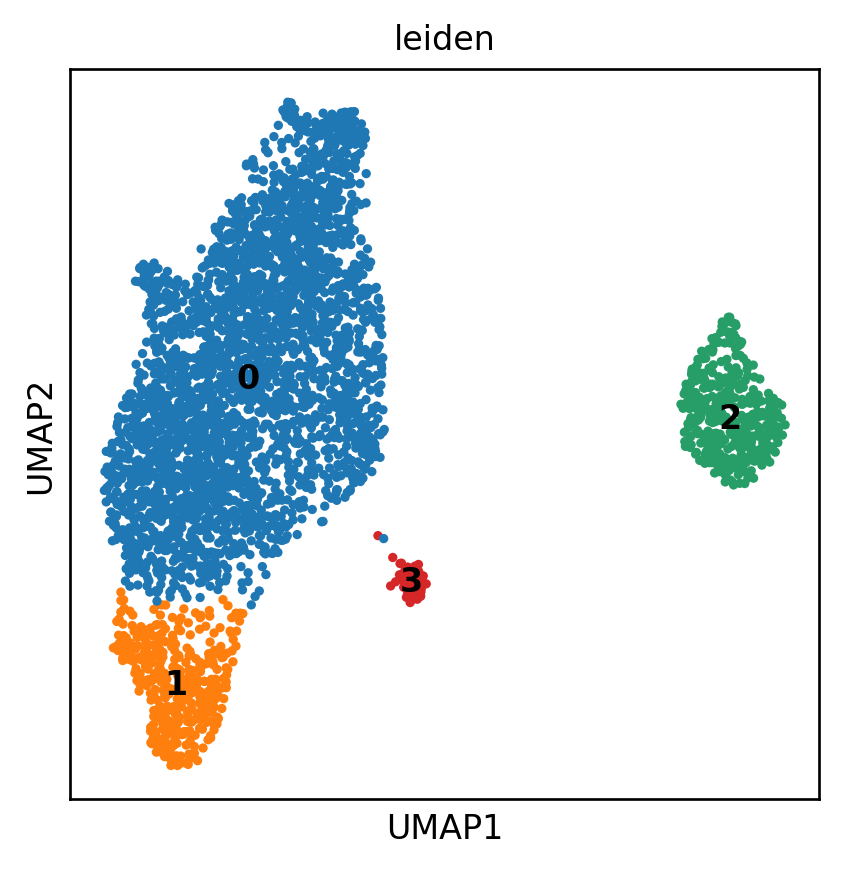

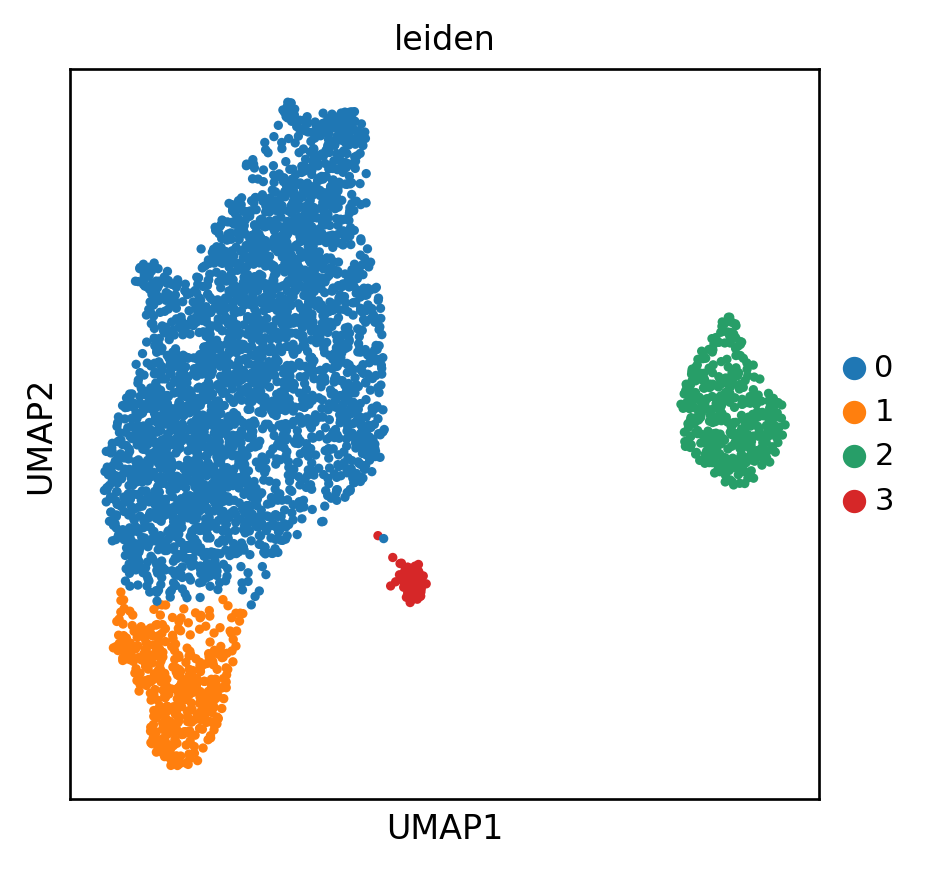

In [ ]:
# Inspect the UMAP plot - overlay with the results of the leiden clustering algorithm
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', save='_'+sample_name_prefix+'.leiden.pdf')
sc.pl.umap(adata, color=['leiden'], save='_'+sample_name_prefix+'.leiden.legend.pdf')

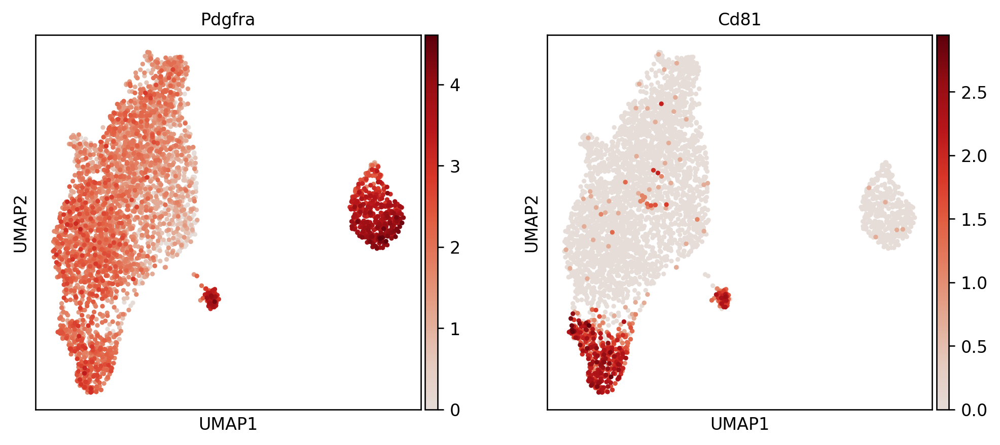

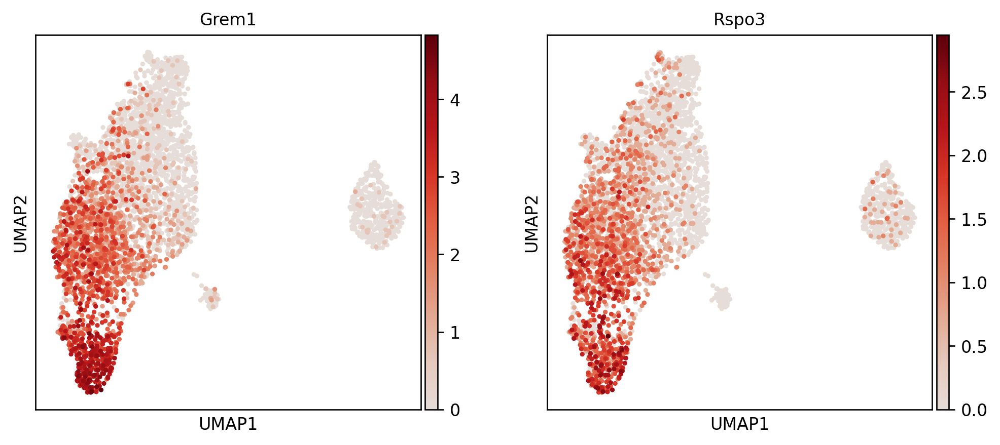

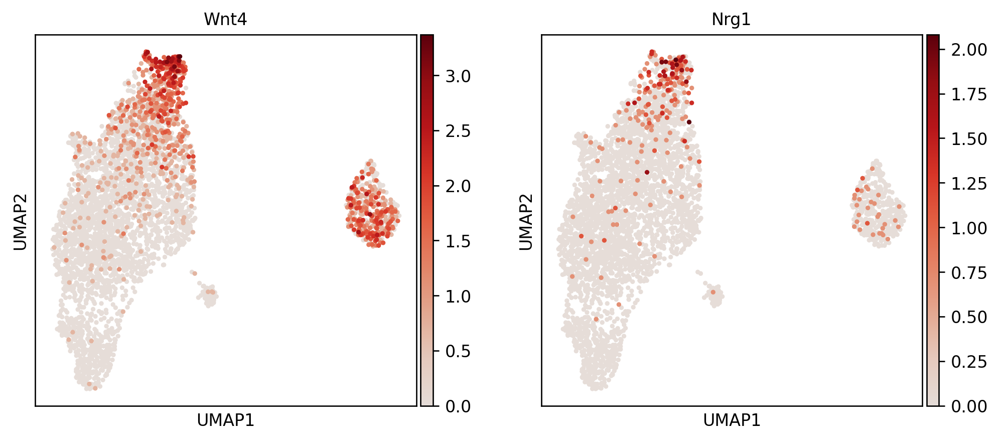

In [ ]:
# Overlay with a few marker genes
sc.pl.umap(adata, color=['Pdgfra','Cd81'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Grem1','Rspo3'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))
sc.pl.umap(adata, color=['Wnt4','Nrg1'], layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

### Identify Differentially Expressed Genes

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', use_raw=False, layer='raw', reference='rest', n_genes=100, method='wilcoxon', 
                        corr_method='benjamini-hochberg', log_transformed=True, key_added='rank_genes_groups')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


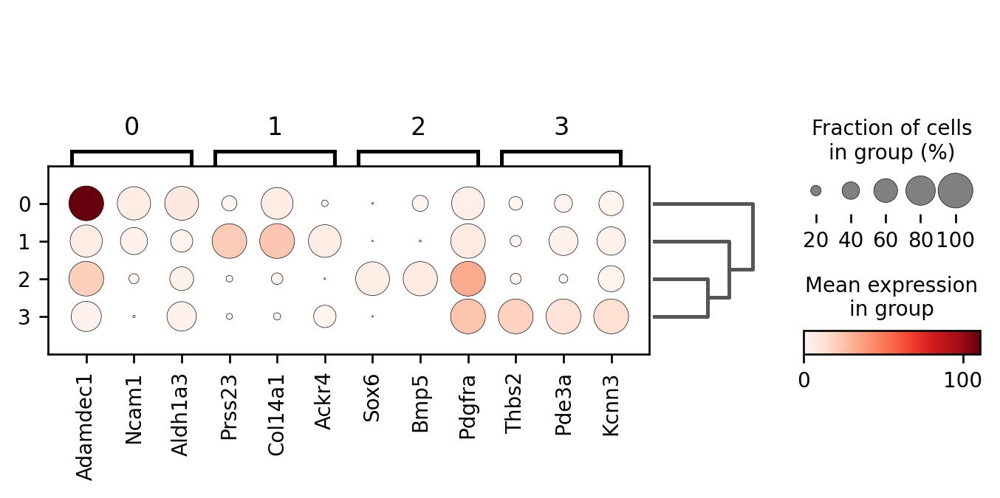

In [ ]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3, groupby='leiden');

### Overlay cNMF Gene Expression Programs (GEPs)

In [ ]:
# cNMF settings (modify as needed)
cNMF_k = 16
cNMF_density_thresh = 0.1
cNMF_local_neighborhood_size = 0.3

# Load cNMF usage matrix into AnnData
usage_path = '/content/cNMF-output/Shiv2022-WangSInt-cNMF/Shiv2022-WangSInt-cNMF.usages.k_16.dt_0_1.consensus.txt'
usage_matrix = pd.read_csv(usage_path, sep='\t', index_col=0)
usage_matrix.columns = ['GEP_%s' % i for i in usage_matrix.columns]
usage_matrix = usage_matrix.div(usage_matrix.sum(axis=1), axis=0)
for x in usage_matrix.columns:
  adata.obs[x] = usage_matrix[x].tolist()

In [ ]:
# Obtain the top z-scored genes for each GEP
n_top_genes = 2000

gene_scores_path = '/content/cNMF-output/Shiv2022-WangSInt-cNMF/Shiv2022-WangSInt-cNMF.gene_spectra_score.k_16.dt_0_1.txt'
gene_scores = pd.read_csv(gene_scores_path, sep='\t', index_col=0).T

top_genes = []
for gep in gene_scores.columns:
    top_genes.append(list(gene_scores.sort_values(by=gep, ascending=False).index[:n_top_genes]))    
top_genes = pd.DataFrame(top_genes, index=usage_matrix.columns).T
top_genes.to_csv('sample5-WangSInt_GEPtopgenes.csv')

pd.options.display.max_columns=None
pd.options.display.max_rows=20

top_genes

,GEP_1,GEP_2,GEP_3,GEP_4,GEP_5,GEP_6,GEP_7,GEP_8,GEP_9,GEP_10,GEP_11,GEP_12,GEP_13,GEP_14,GEP_15,GEP_16
0,Igkc,Prss23,Tmem176b,Gfra3,Mefv,Sox17,Mep1b,Cxcl10,Ptn,Iqgap3,Slc35f2,Hmcn2,Mfap5,Ighd,Cald1,Igfbp7
1,Jchain,Col1a2,Agt,Gm2115,Tlr13,Adgrl4,Ffar4,AW112010,Thbs2,Melk,Sh2d1a,mt-Co1,Crip1,Bank1,Col12a1,Rpl21
2,Slamf7,Col1a1,Tmem176a,Sh3tc2,P2ry6,8430408G22Rik,Itgb6,Serpina3g,Pla2g7,Ska1,Ifng,Ntn1,Cd248,Blk,Sox6,Rpl13
3,Igha,Grem1,Ccl11,Gjc3,C1qa,AU021092,Tmem238l,Gbp5,Jam2,Top2a,Itk,Dpt,Igfbp6,Tmem108,Ednra,Ubb
4,Iglv3,Col3a1,Ecm1,Gpr37l1,Apol7c,Scgb3a1,Cyp2c68,Ccl2,Pde3a,Hmmr,Il21r,Cavin1,Gfpt2,Gm19951,Bmp7,H2-D1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,AC141880.1,Gm49179,L3mbtl2,Zfp638,Pgghg,Tex12,Mrpl48,Gpc4,2410004P03Rik,Mphosph9,Tbca,Micall1,Magt1,5730419F03Rik,Mtmr7,B3galnt1
1996,Gm11365,AK157302,B3gnt9,Ccnd1,Psmb7,Rpl8,Fam118b,Mfsd14b,Ndfip1,Adck1,Fam204a,Pi4ka,Rita1,Fyttd1,Selenos,Cmss1
1997,Fbxo46,Ibtk,Desi2,Mlf2,Cdan1,Apol7e,Dnajb11,Dhx9,Dchs2,Maff,Neu1,Kdm6a,Tshz2,Utp11,Myef2,AC134548.2
1998,BC037034,Mettl25,Fam117a,Plpp1,Utp11,Psmd7,Glce,Zcchc7,Nudt12,Spred1,Pmm2,Lrsam1,Polr3e,Nmt1,Mrpl13,Ccdc32


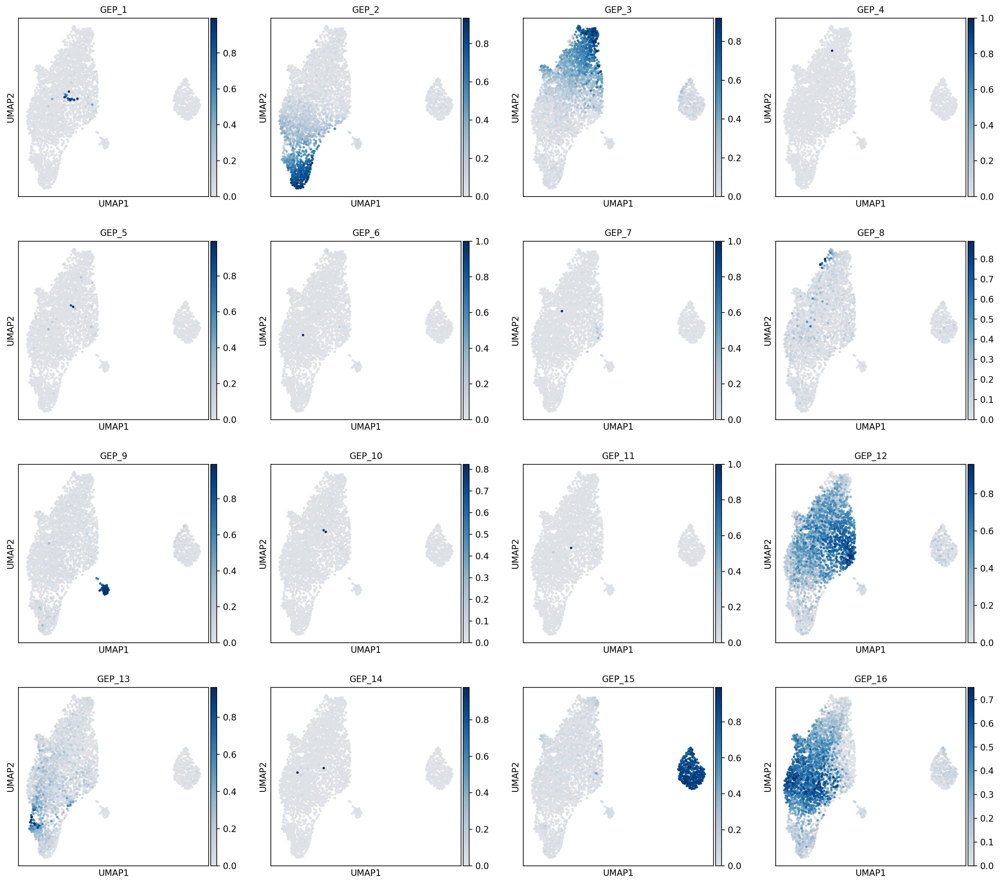

In [ ]:
# Plot the UMAP with GEP scores  
sc.pl.umap(adata, color=usage_matrix.columns, save='_'+sample_name_prefix+'.all.gep.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9))

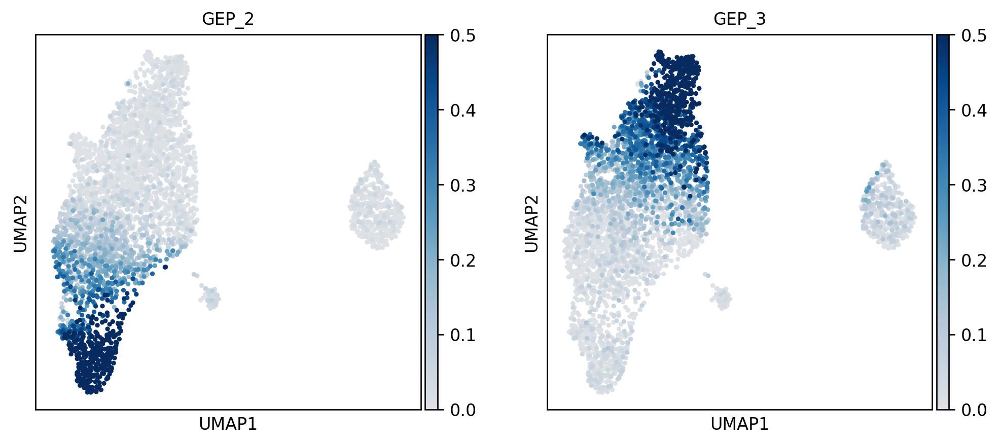

In [ ]:
# Plot the UMAP with GEP scores  
sc.pl.umap(adata, color=['GEP_2','GEP_3'], save='_'+sample_name_prefix+'.gep2+3.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.5)


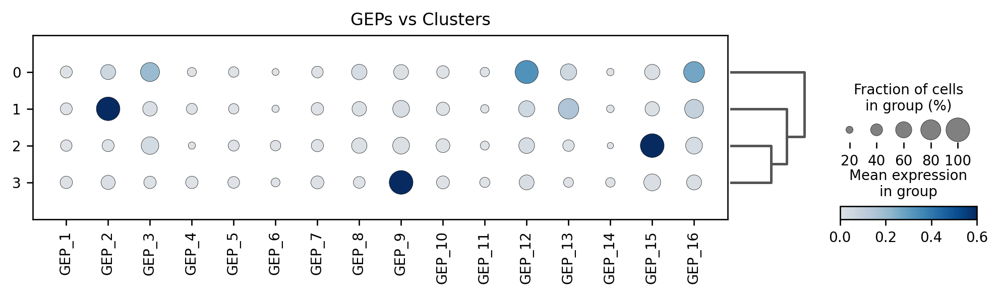

In [ ]:
# Confirm GEP specificity with dot plots
sc.pl.dotplot(adata, usage_matrix.columns, groupby='leiden', dendrogram=True, layer='raw', 
              title='GEPs vs Clusters', figsize=[10,2],
              save=sample_name_prefix+'.gep-vs-leiden-dotplot.pdf', cmap=dew.darken_cmap(plt.cm.Blues, 0.9), vmin=0, vmax=0.6)

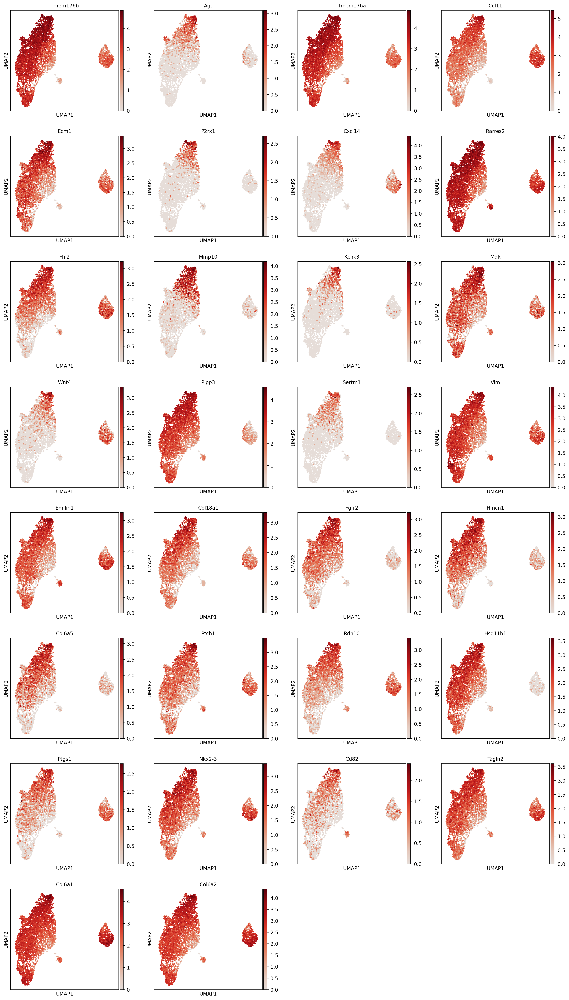

In [ ]:
# Overlay the top 30 genes from GEP3 (Wnt4 is ranked #13) 
sc.pl.umap(adata, color=top_genes['GEP_3'][0:30].tolist(), ncols=4, layer='raw', save='_'+sample_name_prefix+'.gep3.30genes.pdf', cmap=dew.darken_cmap(plt.cm.Reds, 0.9))

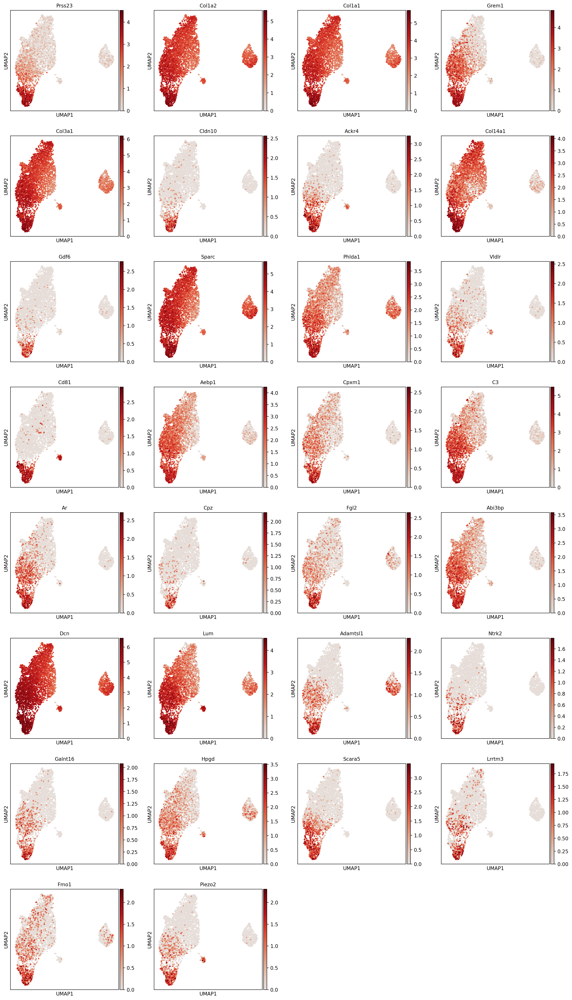

In [ ]:
# Overlay the top 30 genes from GEP2 (Grem1 is ranked #4) 
sc.pl.umap(adata, color=top_genes['GEP_2'][0:30].tolist(), ncols=4, layer='raw', cmap=dew.darken_cmap(plt.cm.Reds, 0.9), save='_'+sample_name_prefix+'.gep6.30genes.pdf')

### Plot GEPs VS Pseudotime


In [ ]:
# subset the continuum of cell states encompassing leiden clusters 0 & 1
flag = np.in1d(adata.obs['leiden'],['0','1'])
adata_sub = adata[flag,:]

In [ ]:
# select a root cell at random from leiden cluster 1
adata_sub.uns['iroot'] = np.flatnonzero(adata_sub.obs['leiden'] == '1')[4]

/usr/local/lib/python3.7/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/usr/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


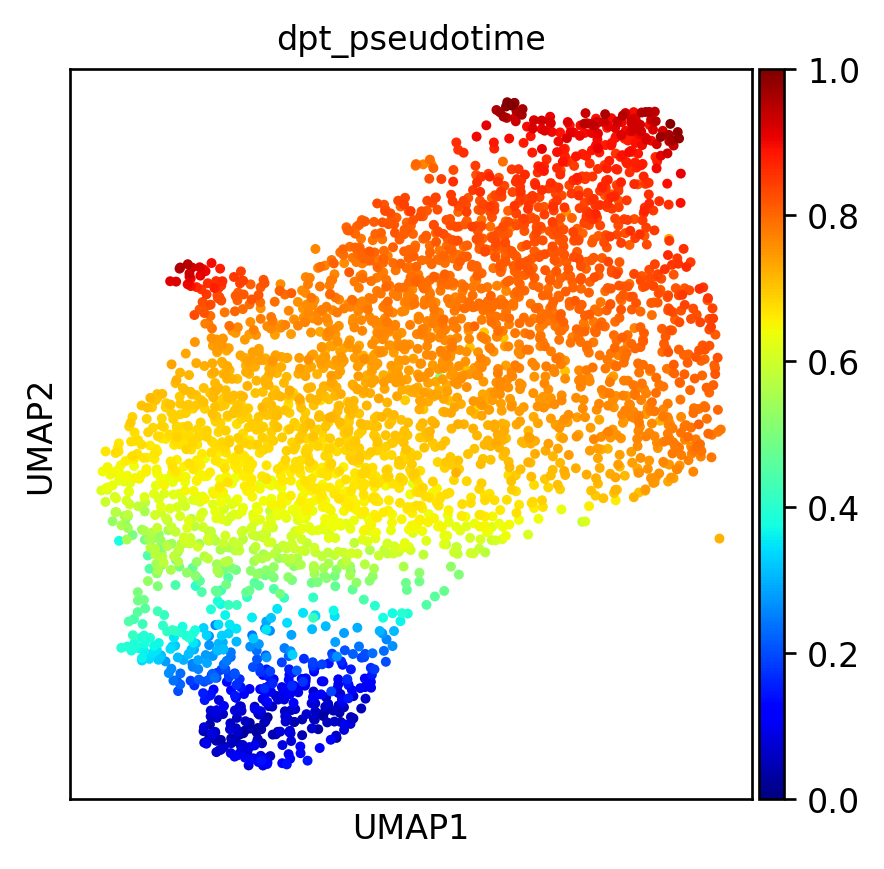

In [ ]:
# compute & plot pseudotime values
sc.tl.diffmap(adata_sub)
sc.tl.dpt(adata_sub)
sc.pl.umap(adata_sub, color =['dpt_pseudotime'], cmap='jet', save='_'+sample_name_prefix+'.pseudotime.pdf')

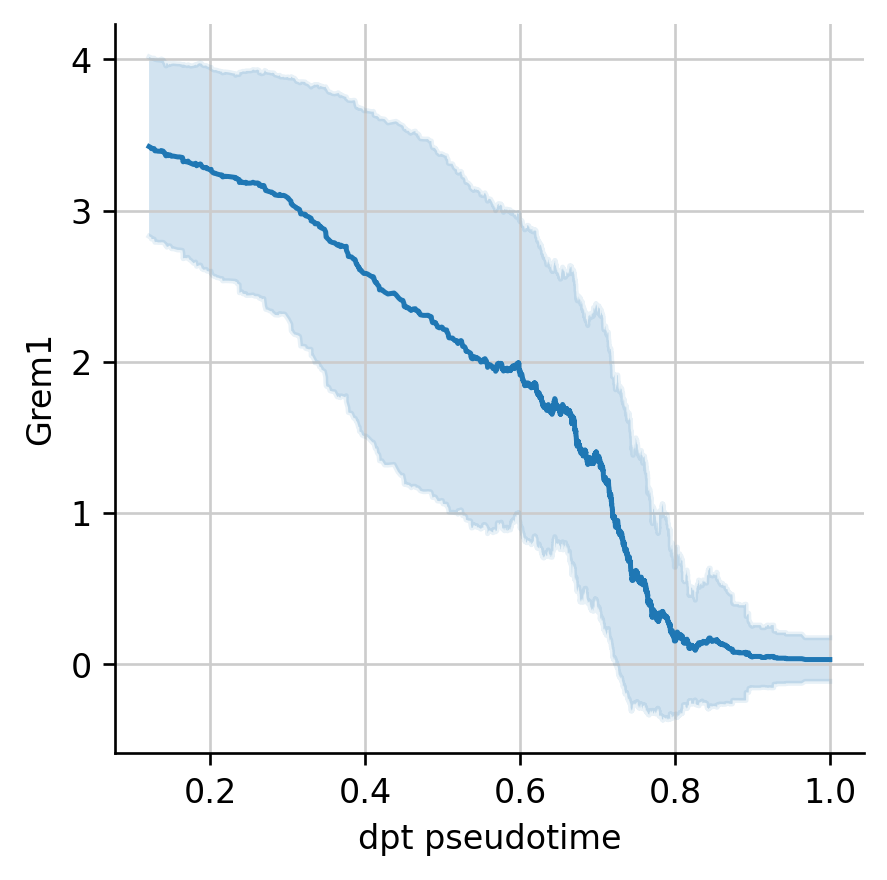

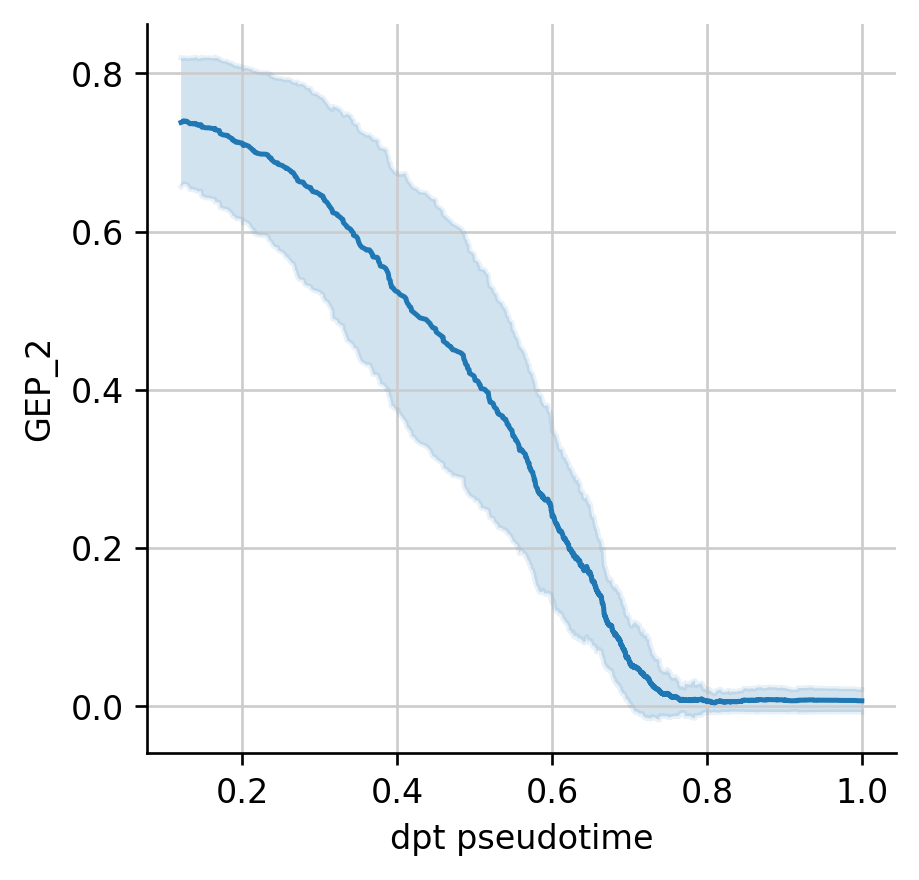

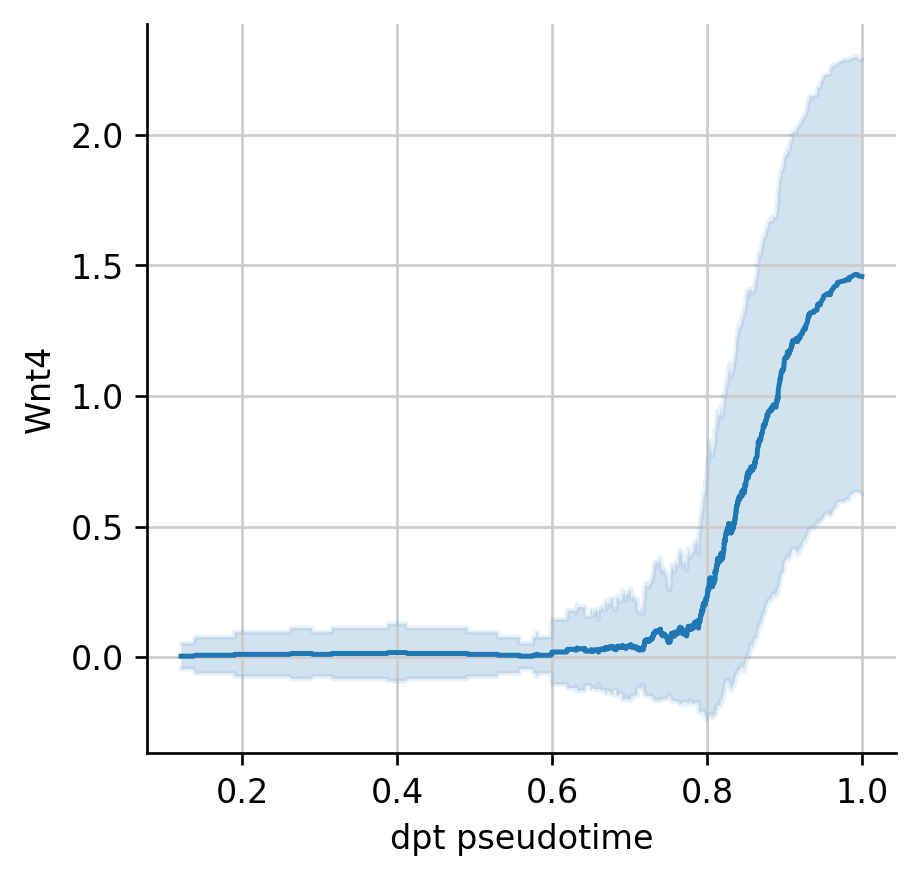

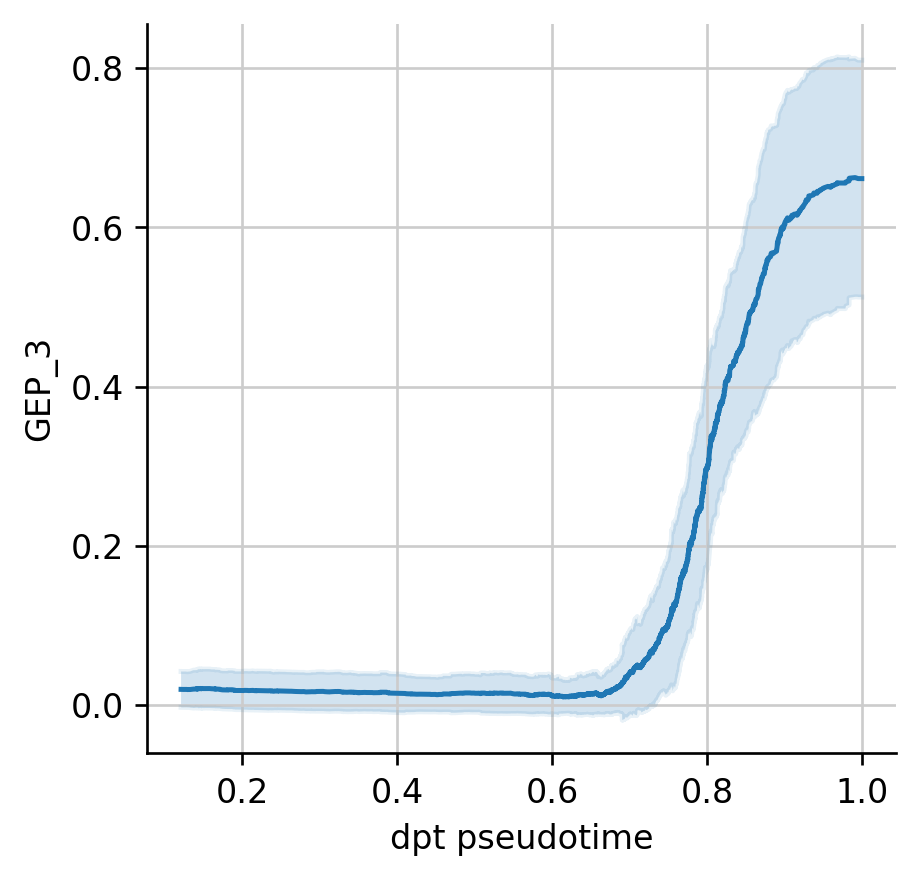

In [ ]:
# plot the pseudotime trajectories for genes & GEPs
dew.plot_dpt_trajectory(adata_sub, 'Grem1', sliding_window=200, save='_'+sample_name_prefix+'.Grem1.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_2', sliding_window=200, save='_'+sample_name_prefix+'.gep2.pdf')

dew.plot_dpt_trajectory(adata_sub, 'Wnt4', sliding_window=200, save='_'+sample_name_prefix+'.Wnt4.pdf')
dew.plot_dpt_trajectory(adata_sub, 'GEP_3', sliding_window=200, save='_'+sample_name_prefix+'.gep3.pdf')


In [ ]:
adata_sub

AnnData object with n_obs × n_vars = 3370 × 31053
    obs: 'total_counts', 'n_genes_by_counts', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_doublet', 'leiden', 'GEP_1', 'GEP_2', 'GEP_3', 'GEP_4', 'GEP_5', 'GEP_6', 'GEP_7', 'GEP_8', 'GEP_9', 'GEP_10', 'GEP_11', 'GEP_12', 'GEP_13', 'GEP_14', 'GEP_15', 'GEP_16', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden', 'iroot', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_dif